In [2]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelEncoder
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# NN 
import  tensorflow
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout,Embedding, SimpleRNN,Bidirectional,LSTM, GRU

# preprocessing
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing import sequence

In [3]:
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from nltk.tokenize import word_tokenize

In [4]:
df = pd.read_csv(r"C:\Users\MARK 1.0\OneDrive\Desktop\NLP\train.csv")

In [5]:
df.head()

,id,title,author,text,label
0,0,House Dem Aide: We Didn’t Even See Comey’s Let...,Darrell Lucus,House Dem Aide: We Didn’t Even See Comey’s Let...,1
1,1,"FLYNN: Hillary Clinton, Big Woman on Campus - ...",Daniel J. Flynn,Ever get the feeling your life circles the rou...,0
2,2,Why the Truth Might Get You Fired,Consortiumnews.com,"Why the Truth Might Get You Fired October 29, ...",1
3,3,15 Civilians Killed In Single US Airstrike Hav...,Jessica Purkiss,Videos 15 Civilians Killed In Single US Airstr...,1
4,4,Iranian woman jailed for fictional unpublished...,Howard Portnoy,Print \nAn Iranian woman has been sentenced to...,1


In [6]:
df = df.dropna()

Text(0.5, 1.0, 'label Data Distribution')

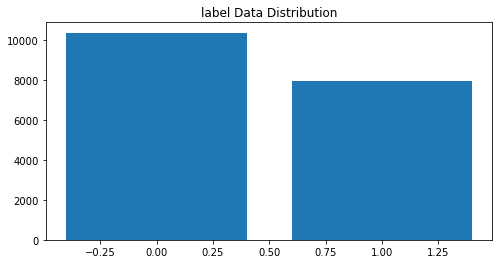

In [7]:
val_count = df.label.value_counts()

plt.figure(figsize=(8,4))
plt.bar(val_count.index, val_count.values)
plt.title("label Data Distribution")

In [8]:
import nltk

In [9]:
stlist=stopwords.words("english")
stlist

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [10]:
def preprocess_text(text):
    text=text.lower()
    tokens=word_tokenize(text)
    cleantokens=[i for i in tokens if i.isalpha()]
    cleantokens1=[i for i in cleantokens if i not in stlist]
    lm=WordNetLemmatizer()
    lemm_tokens=[lm.lemmatize(i)for i in cleantokens1]
    return ' '.join(lemm_tokens)

In [11]:
pos=' '.join(df[df["label"]==1]["text"])

In [12]:
neg=' '.join(df[df["label"]==0]["text"])

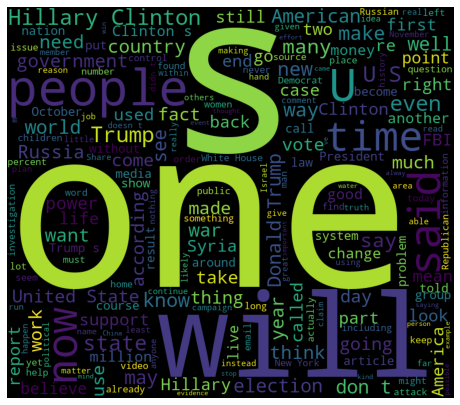

In [13]:
wc=WordCloud(width=800,height=700,min_font_size=10)
wc.generate(pos)
plt.figure(figsize=(8,8))
plt.imshow(wc)
plt.axis("off")
plt.show()

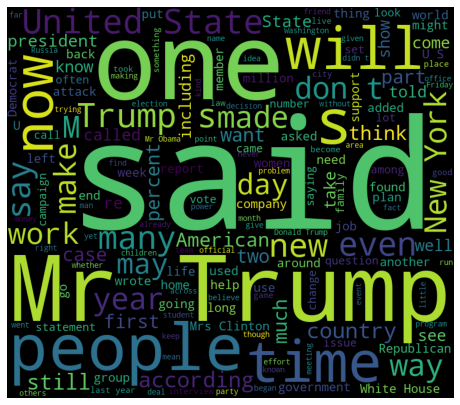

In [14]:
wc=WordCloud(width=800,height=700,min_font_size=10)
wc.generate(neg)
plt.figure(figsize=(8,8))
plt.imshow(wc)
plt.axis("off")
plt.show()

In [15]:
x=df['text']
y=df['label']

In [16]:
x

0        House Dem Aide: We Didn’t Even See Comey’s Let...
1        Ever get the feeling your life circles the rou...
2        Why the Truth Might Get You Fired October 29, ...
3        Videos 15 Civilians Killed In Single US Airstr...
4        Print \nAn Iranian woman has been sentenced to...
                               ...                        
20795    Rapper T. I. unloaded on black celebrities who...
20796    When the Green Bay Packers lost to the Washing...
20797    The Macy’s of today grew from the union of sev...
20798    NATO, Russia To Hold Parallel Exercises In Bal...
20799      David Swanson is an author, activist, journa...
Name: text, Length: 18285, dtype: object

In [17]:
y

0        1
1        0
2        1
3        1
4        1
        ..
20795    0
20796    0
20797    0
20798    1
20799    1
Name: label, Length: 18285, dtype: int64

In [18]:
xtrain,xtest,ytrain,ytest=train_test_split(x,y,test_size=0.3,random_state=1)

In [19]:
tok= Tokenizer()
tok.fit_on_texts(xtrain)

In [20]:
voc=tok.index_word
print(voc)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [21]:
voclen=len(voc)

In [22]:
trainseq=tok.texts_to_sequences(xtrain)

In [23]:
trainseq

[[15034,
  71127,
  1843,
  1975,
  3161,
  35,
  925,
  6,
  1,
  2437,
  6467,
  5,
  5730,
  3,
  30041,
  8,
  11,
  1,
  5686,
  45,
  3,
  58,
  278,
  771,
  44,
  67,
  5,
  1456,
  15,
  29,
  1588,
  2382,
  9,
  5,
  3253,
  166,
  3551,
  5110,
  95388,
  6,
  1244,
  37,
  2544,
  8,
  5,
  175,
  298,
  272,
  1016,
  2663,
  30,
  497,
  31,
  21,
  8401,
  45,
  3,
  3545,
  1315,
  90,
  4287,
  1604,
  920,
  3438,
  11,
  1,
  702,
  1286,
  3,
  6867,
  2271,
  2,
  6901,
  1,
  2197,
  3,
  1,
  2437,
  1,
  5130,
  2544,
  18322,
  27349,
  5731,
  56,
  33,
  267,
  80,
  503,
  89,
  23,
  26267,
  3,
  693,
  11164,
  30041,
  287,
  497,
  1115,
  1,
  2820,
  3,
  667,
  1680,
  6,
  95389,
  585,
  12110,
  751,
  45470,
  900,
  3127,
  5413,
  12265,
  11805,
  4,
  2948,
  6607,
  10,
  17,
  24,
  27349,
  3266,
  32,
  13,
  827,
  6,
  1,
  5438,
  6,
  381,
  113,
  4347,
  7578,
  32,
  43,
  41391,
  30042,
  3,
  4118,
  239,
  539,
  2,
  2142,
  

In [24]:
doclen=[]
for i in trainseq:
  doclen.append(len(i))

print(doclen)

[1259, 1373, 1280, 151, 1203, 1225, 1192, 855, 181, 930, 671, 444, 412, 785, 516, 661, 236, 1019, 741, 65, 794, 96, 314, 143, 441, 1590, 118, 444, 54, 651, 299, 995, 756, 2282, 782, 650, 454, 1431, 1989, 1462, 1214, 1774, 572, 290, 197, 539, 527, 488, 999, 1627, 732, 244, 1165, 1087, 119, 530, 1138, 816, 625, 27, 449, 1539, 248, 113, 332, 1110, 1030, 1057, 871, 1249, 160, 289, 1224, 6, 397, 1418, 691, 514, 353, 217, 1381, 1254, 29, 4131, 398, 694, 2110, 358, 347, 1620, 255, 853, 2245, 1527, 84, 354, 2593, 1691, 1327, 595, 413, 536, 533, 495, 868, 284, 183, 53, 391, 865, 986, 1477, 990, 598, 1618, 1091, 281, 1374, 627, 93, 717, 200, 293, 1697, 729, 586, 1125, 595, 1080, 170, 457, 730, 394, 458, 242, 134, 1548, 802, 191, 2322, 36, 126, 443, 813, 794, 360, 48, 144, 291, 335, 447, 1212, 1478, 687, 618, 964, 226, 1170, 1213, 713, 185, 3247, 744, 67, 491, 275, 389, 2124, 2319, 294, 160, 482, 513, 1875, 815, 707, 262, 1095, 1418, 1278, 927, 981, 874, 486, 649, 1018, 237, 83, 1249, 829, 1407, 

In [25]:
max(doclen)

24512

In [26]:
np.quantile(doclen,0.99)

4269.1600000000035

In [27]:
max_length=4269
trainmatrix=sequence.pad_sequences(trainseq,maxlen=max_length)

In [28]:
trainmatrix

array([[    0,     0,     0, ...,    22,   437,    10],
       [    0,     0,     0, ...,    63,  2638,    14],
       [    0,     0,     0, ...,   486,     3,  2700],
       ...,
       [    0,     0,     0, ..., 18861, 15998,  6143],
       [    0,     0,     0, ...,    11,   193,  5314],
       [    0,     0,     0, ...,     5,   684,    10]])

In [29]:
testseq=tok.texts_to_sequences(xtest)
testmatrix=sequence.pad_sequences(testseq,maxlen=max_length)

# LSTM

In [ ]:
model5=Sequential()
model5.add(Embedding(input_dim=voclen+1,
          output_dim=100,
          input_length=max_length,
          mask_zero=True))

model5.add(LSTM(32))
model5.add(Dense(16,activation="relu"))
model5.add(Dense(8,activation="relu"))
model5.add(Dense(1,activation="sigmoid"))

model5.compile(optimizer="adam",loss="binary_crossentropy",metrics="accuracy")
model5.fit(trainmatrix,ytrain,epochs=5,batch_size=40)
ypred=model5.predict(testmatrix)
ypred=np.where(ypred>=0.5,1,0)
print(classification_report(ytest,ypred))

Epoch 1/5
320/320 [==============================] - 2734s 8s/step - loss: 0.3112 - accuracy: 0.8716
Epoch 2/5
320/320 [==============================] - 2636s 8s/step - loss: 0.1193 - accuracy: 0.9580
Epoch 3/5
320/320 [==============================] - 2412s 8s/step - loss: 0.0505 - accuracy: 0.9855
Epoch 4/5
161/320 [==============>...............] - ETA: 11:42 - loss: 0.0282 - accuracy: 0.9929

# GRU

In [ ]:
model6=Sequential()
model6.add(Embedding(input_dim=voclen+1,
          output_dim=100,
          input_length=max_length,
          mask_zero=True))

model6.add(GRU(32))
model6.add(Dense(16,activation="relu"))
model6.add(Dropout(0.2))
model6.add(Dense(8,activation="relu"))
model6.add(Dense(1,activation="sigmoid"))

model6.compile(optimizer="adam",loss="binary_crossentropy",metrics="accuracy")
model6.fit(trainmatrix,ytrain,epochs=5,batch_size=32)
ypred=model6.predict(testmatrix)
ypred=np.where(ypred>=0.5,1,0)
print(classification_report(ytest,ypred))

# Multi-layer-RNN

In [ ]:
model7=Sequential()
model7.add(Embedding(input_dim=voclen+1,
          output_dim=100,
          input_length=max_length,
          mask_zero=True))
model7.add(SimpleRNN(32,return_sequences=True))
model7.add(SimpleRNN(32))
model7.add(Dense(16,activation="relu"))
model7.add(Dropout(0.2))
model7.add(Dense(8,activation="relu"))
model7.add(Dense(1,activation="sigmoid"))
model7.compile(optimizer="adam",loss="binary_crossentropy",metrics="accuracy")
model7.fit(trainmatrix,ytrain,epochs=5,batch_size=128)
ypred=model7.predict(testmatrix)
ypred=np.where(ypred>=0.5,1,0)
print(classification_report(ytest,ypred))

# Bidirectional

In [ ]:
model8=Sequential()
model8.add(Embedding(input_dim=voclen+1,
          output_dim=100,
          input_length=max_length,
          mask_zero=True))
model8.add(Bidirectional(SimpleRNN(32)))
model8.add(Dense(16,activation="relu"))
model8.add(Dense(8,activation="relu"))
model8.add(Dense(1,activation="sigmoid"))
model8.compile(optimizer="adam",loss="binary_crossentropy",metrics="accuracy")
model8.fit(trainmatrix,ytrain,epochs=6,batch_size=32)
ypred1=model8.predict(testmatrix)
ypred1=np.where(ypred>=0.5,1,0)
print(classification_report(ytest,ypred1))

In [ ]:
model9=Sequential()
model9.add(Embedding(input_dim=voclen+1,
          output_dim=100,
          input_length=max_length,
          mask_zero=True))
model9.add(SimpleRNN(32))
model9.add(Dense(16,activation="relu"))
model9.add(Dense(8,activation="relu"))
model9.add(Dense(1,activation="sigmoid"))
model9.compile(optimizer="adam",loss="binary_crossentropy",metrics="accuracy")
model9.fit(trainmatrix,ytrain,epochs=5,batch_size=32)
ypred=model9.predict(testmatrix)
ypred=np.where(ypred>=0.5,1,0)
print(classification_report(ytest,ypred))